In [1]:
import vtk

In [2]:
%matplotlib inline
from dipy.reconst.dti import fractional_anisotropy, color_fa
from argparse import ArgumentParser
from scipy import ndimage
import os
import re
import numpy as np
import nibabel as nb
import sys
import matplotlib

# matplotlib.use('Agg')  # very important above pyplot import
import matplotlib.pyplot as plt

In [3]:
from dipy.reconst.dti import from_lower_triangular

In [4]:
# img = nb.load('fibers/dogsigma_0gausigma_0tensorfsl.nii')
# ev = nb.load('v140/result/dogsigma_0.03125_gausig0.071875/v140_ch0_tensordtk_dogsig0.03125_gausig0.071875_tensor.nii')

In [5]:
tsr = nb.load('other/pics/sweep/fullsample_dogsig1.3_gausig0.03_rgb_upper_dtk.nii.gz')

In [6]:
from dipy.data import get_sphere
sphere = get_sphere('symmetric724')

from dipy.viz import fvtk
ren = fvtk.ren()

In [7]:
img = nb.load('other/pics/sweep/v130_ch1_tensordtk_dogsig1.3_gausig0.03_tensor.nii')

data = img.get_data()
output = from_lower_triangular(data)
output_ds = output[:, :, :, :, :]
print output.shape
print output_ds.shape
print data.shape
print "GOT DATA"

from dipy.reconst.dti import decompose_tensor
evalues, evectors = decompose_tensor(output_ds)

(300L, 300L, 300L, 3L, 3L)
(300L, 300L, 300L, 3L, 3L)
(300L, 300L, 300L, 6L)
GOT DATA


In [8]:
print evalues.shape, evectors.shape

(300L, 300L, 300L, 3L) (300L, 300L, 300L, 3L, 3L)


In [9]:
FA = fractional_anisotropy(evalues)
FA[np.isnan(FA)] = 0
FA = np.clip(FA, 0, 1)
RGB = color_fa(FA, evectors)

In [10]:
# print cfa.shape
# print cfa.max()

In [11]:
# print evals2.shape, evecs2.shape

In [12]:
print tsr.get_data().shape
print tsr.get_data()[0,0,0,0]

(300L, 300L, 300L, 3L)
0


In [13]:
evals2 = np.copy(evalues[160:200, 160:200, 79:80])
evecs2 = np.copy(evectors[160:200, 160:200, 79:80])

In [14]:
# RGB2 = tsr.get_data()
cfa = np.copy(RGB[160:200,160:200,79:80])

In [15]:
print cfa.min()

1.41854e-07


In [16]:
cfa /= cfa.max()
# cfa = cfa * 255

fvtk.add(ren, fvtk.tensor(evals2, evecs2, cfa, sphere))

In [17]:
print('Saving illustration as dtk_tensor_ellipsoids.png')
fvtk.record(ren, n_frames=1, out_path='dtk_tensor_ellipsoids.png', size=(600, 600))

Saving illustration as dtk_tensor_ellipsoids.png


In [18]:
# affine = img.get_affine()

# fa = nb.Nifti1Image(np.array(255 * RGB, 'uint8'), affine)
# im = fa.get_data()

C:\Users\lk_zh\Anaconda2\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: get_affine method is deprecated.
Please use the ``img.affine`` property instead.

* deprecated from version: 2.1
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 4.0
  if __name__ == '__main__':


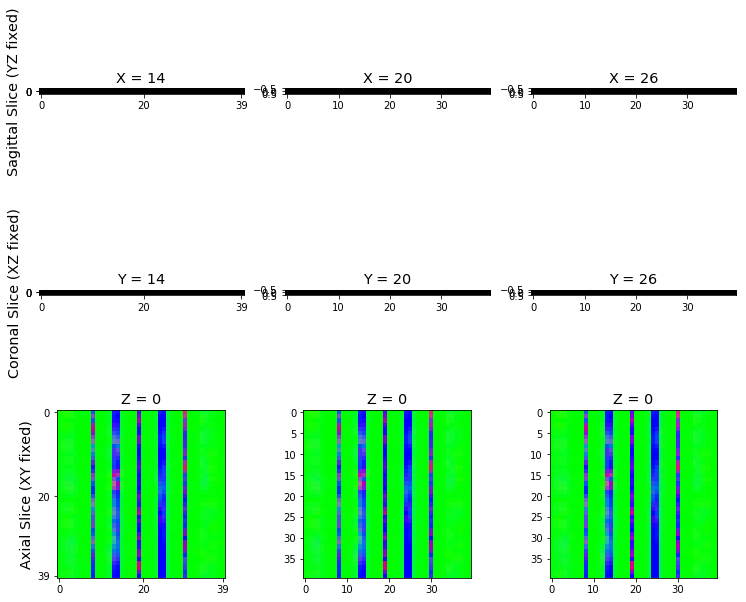

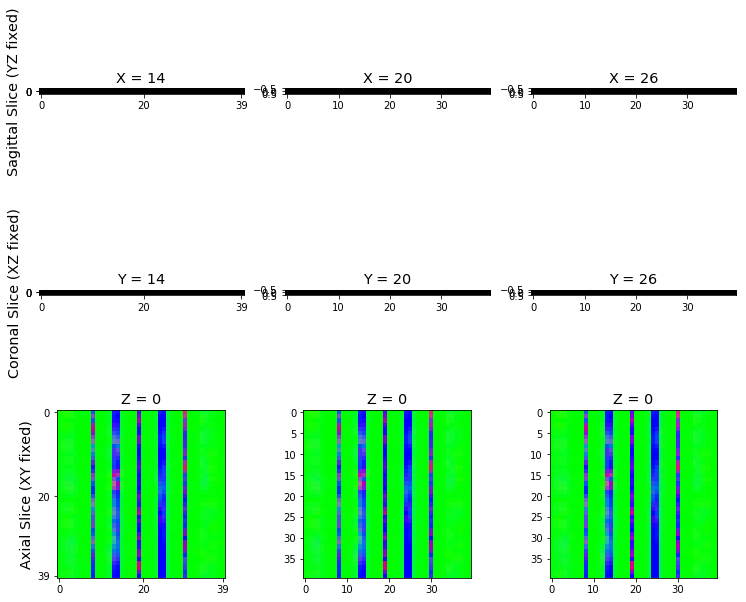

In [19]:
# plot_rgb(RGB)
plot_rgb(cfa)

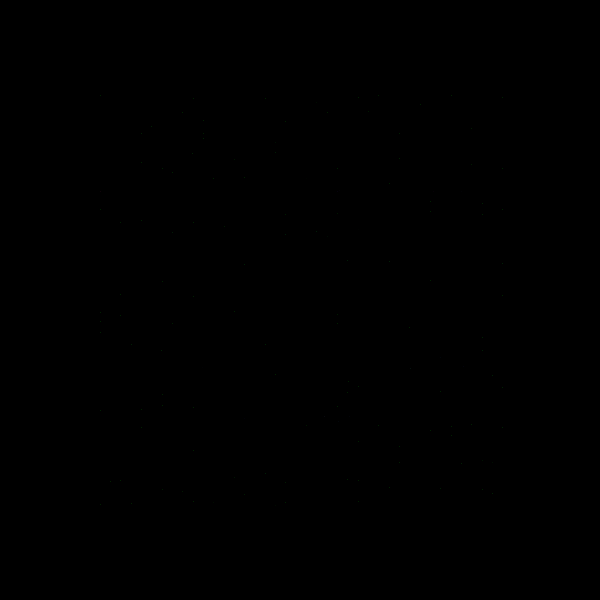

In [38]:
Image('dtk_tensor_ellipsoids.png')

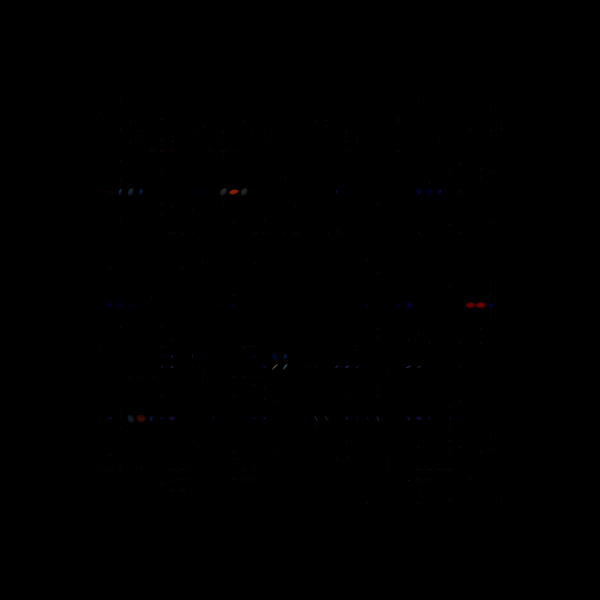

In [39]:
Image('fsl_tensor_ellipsoids.png')

In [20]:
import tractography

(300L, 300L, 3L)
(300L, 300L, 3L)
(300L, 300L, 3L)
(300L, 300L, 3L)
(300L, 300L, 3L)
(300L, 300L, 3L)
(300L, 300L, 3L)
(300L, 300L, 3L)
(300L, 300L, 3L)


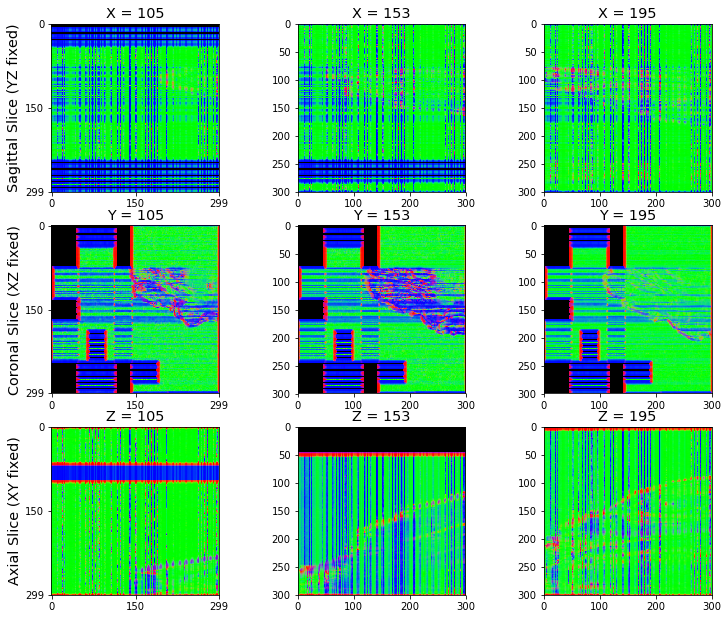

In [21]:
tensor_stream = tractography.tensor2tract(data, False)

43019


KeyboardInterrupt: 

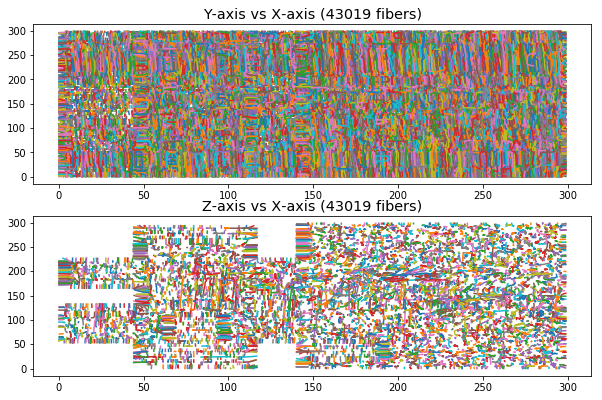

In [23]:
f = tractography.fiber_stream(tensor_stream)

In [24]:
datafsl = np.copy(data)
tmp = np.copy(datafsl[:,:,:,3])
datafsl[:,:,:,3] = datafsl[:,:,:,2]
datafsl[:,:,:,2] = tmp

In [25]:
outputfsl = from_lower_triangular(datafsl)
evaluesfsl, evectorsfsl = decompose_tensor(outputfsl)
FAfsl = fractional_anisotropy(evaluesfsl)
FAfsl[np.isnan(FAfsl)] = 0
FAfsl = np.clip(FAfsl, 0, 1)
RGBfsl = color_fa(FAfsl, evectorsfsl)

In [26]:
evals2fsl = np.copy(evaluesfsl[160:200, 160:200, 79:80])
evecs2fsl = np.copy(evectorsfsl[160:200, 160:200, 79:80])

In [27]:
cfafsl = np.copy(RGBfsl[160:200,160:200,79:80])

In [28]:
cfafsl /= cfafsl.max()
# cfa = cfa * 255

fvtk.add(ren, fvtk.tensor(evals2fsl, evecs2fsl, cfafsl, sphere))
fvtk.record(ren, n_frames=1, out_path='fsl_tensor_ellipsoids.png', size=(600, 600))

In [21]:
fvtk.clear(ren)

tensor_odfs = tenmodel.fit(data[20:50, 55:85, 38:39]).odf(sphere)

fvtk.add(ren, fvtk.sphere_funcs(tensor_odfs, sphere, colormap=None))
#fvtk.show(r)
print('Saving illustration as tensor_odfs.png')
fvtk.record(ren, n_frames=1, out_path='tensor_odfs.png', size=(600, 600))

NameError: name 'tenmodel' is not defined

In [5]:
data = img.get_data()
output = from_lower_triangular(data)
output_ds = output[:, :, :, :, :]
print output.shape
print output_ds.shape

(60L, 92L, 60L, 3L, 3L)
(60L, 92L, 60L, 3L, 3L)


In [6]:
print data.shape

(60L, 92L, 60L, 6L)


In [7]:
# FA = fractional_anisotropy(output_ds)
# FA = np.clip(FA, 0, 1)
# FA[np.isnan(FA)] = 0
# print FA.shape

In [8]:
from dipy.reconst.dti import decompose_tensor

In [9]:
evalues, evectors = decompose_tensor(output_ds)
print evectors[..., 0, 0].shape
print evectors.shape[-2:]

(60L, 92L, 60L)
(3L, 3L)


In [10]:
print evalues.shape, evectors.shape

(60L, 92L, 60L, 3L) (60L, 92L, 60L, 3L, 3L)


In [11]:
# print FA[:, :, :, 0].shape
print evectors.shape

(60L, 92L, 60L, 3L, 3L)


In [12]:
FA = fractional_anisotropy(evalues)
print FA.shape

(60L, 92L, 60L)


In [13]:
RGB = color_fa(FA, evectors)
nb.save(nb.Nifti1Image(np.array(255 * RGB, 'uint8'), img.get_affine()), 'tensor_rgb_upper.nii.gz')

C:\Users\lk_zh\Anaconda2\lib\site-packages\ipykernel\__main__.py:2: DeprecationWarning: get_affine method is deprecated.
Please use the ``img.affine`` property instead.

* deprecated from version: 2.1
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 4.0
  from ipykernel import kernelapp as app


In [18]:
def plot_rgb(im):
    plt.rcParams.update({'axes.labelsize': 'x-large',
                         'axes.titlesize': 'x-large'})

    if im.shape == (182, 218, 182):
        x = [78, 90, 100]
        y = [82, 107, 142]
        z = [88, 103, 107]
    else:
        shap = im.shape
        x = [int(shap[0]*0.35), int(shap[0]*0.51), int(shap[0]*0.65)]
        y = [int(shap[1]*0.35), int(shap[1]*0.51), int(shap[1]*0.65)]
        z = [int(shap[2]*0.35), int(shap[2]*0.51), int(shap[2]*0.65)]
    coords = (x, y, z)

    labs = ['Sagittal Slice (YZ fixed)',
            'Coronal Slice (XZ fixed)',
            'Axial Slice (XY fixed)']
    var = ['X', 'Y', 'Z']

    idx = 0
    for i, coord in enumerate(coords):
        for pos in coord:
            idx += 1
            ax = plt.subplot(3, 3, idx)
            ax.set_title(var[i] + " = " + str(pos))
            if i == 0:
                image = ndimage.rotate(im[pos, :, :], 90)
            elif i == 1:
                image = ndimage.rotate(im[:, pos, :], 90)
            else:
                image = im[:, :, pos]

            if idx % 3 == 1:
                ax.set_ylabel(labs[i])
                ax.yaxis.set_ticks([0, image.shape[0]/2, image.shape[0] - 1])
                ax.xaxis.set_ticks([0, image.shape[1]/2, image.shape[1] - 1])

            plt.imshow(image)

    fig = plt.gcf()
    fig.set_size_inches(12.5, 10.5, forward=True)
    return fig

In [15]:
affine = img.get_affine()

fa = nb.Nifti1Image(np.array(255 * RGB, 'uint8'), affine)
im = fa.get_data()

C:\Users\lk_zh\Anaconda2\lib\site-packages\ipykernel\__main__.py:1: DeprecationWarning: get_affine method is deprecated.
Please use the ``img.affine`` property instead.

* deprecated from version: 2.1
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 4.0
  if __name__ == '__main__':


In [16]:
# print np.asarray(fa)

In [35]:
from IPython.display import Image

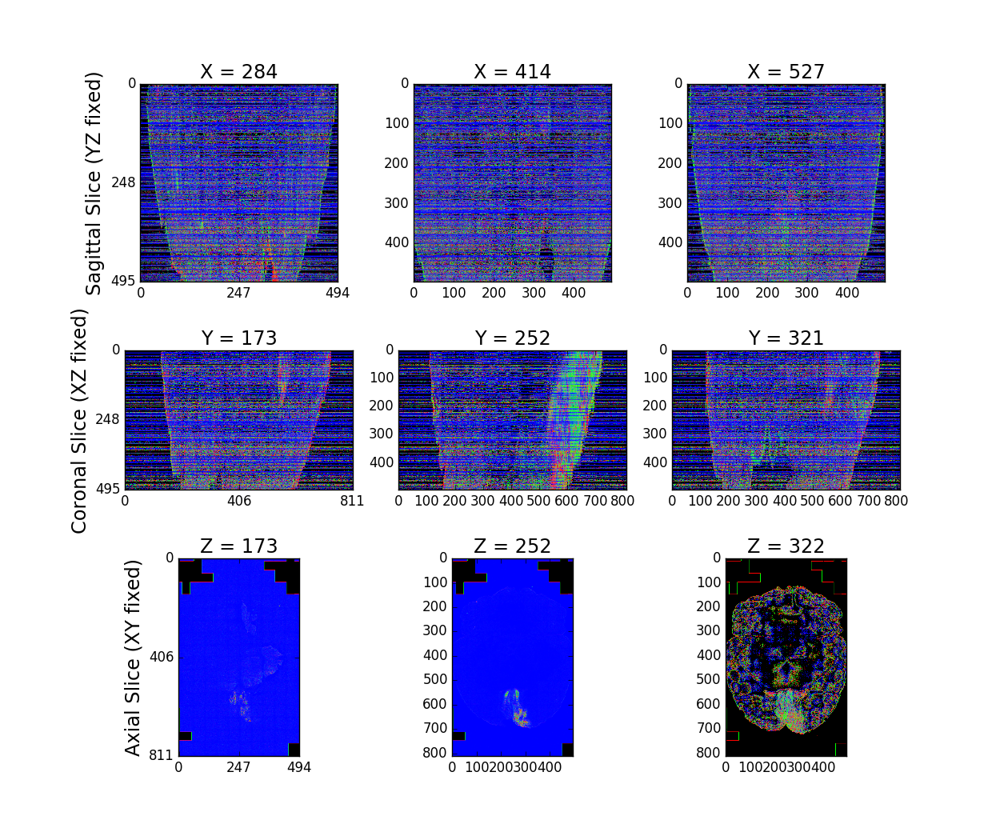

In [2]:
Image("other/fullsample_dogsig0.03125_gausig0.071875_brain_fsl.png")

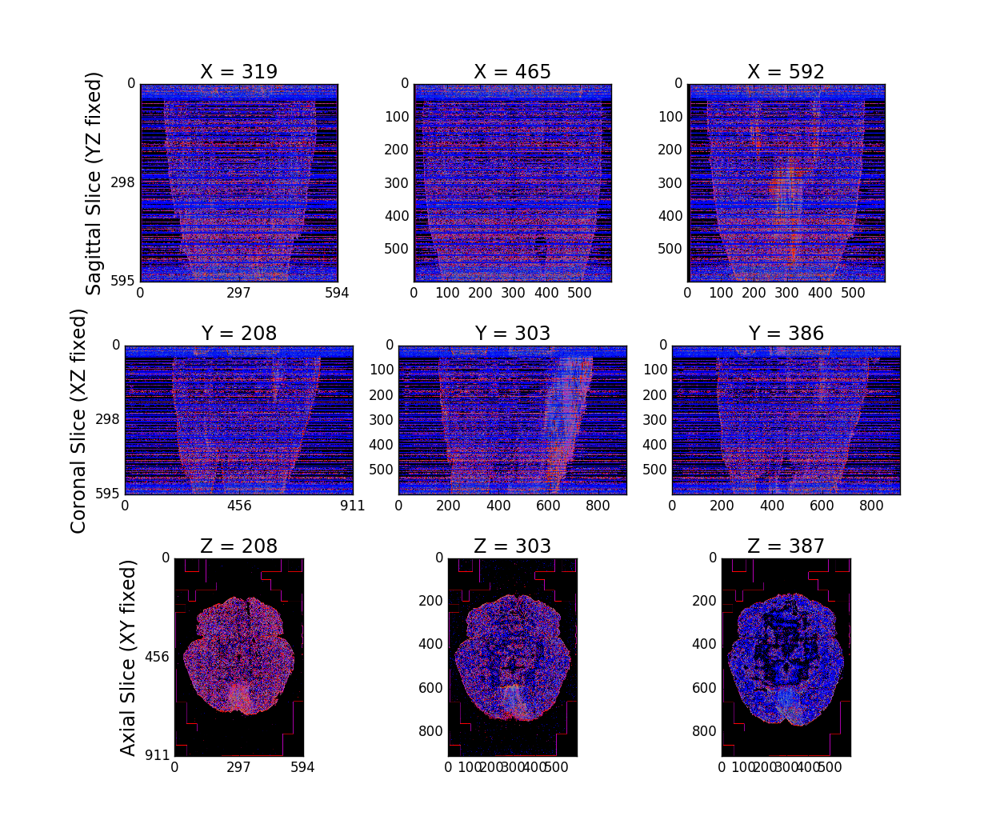

In [6]:
Image("v140/result/full_sample_brain.png", width=1000, height=1000)

In [7]:
import os

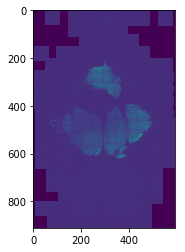

In [8]:
from PIL import Image
im = plt.imread('full_sample/v100/ch0/fullsample40.tiff') 
plt.imshow(im)

In [29]:
import dipy.reconst.dti as dti
from dipy.reconst.dti import fractional_anisotropy

In [30]:
from dipy.data import default_sphere
from dipy.direction import DeterministicMaximumDirectionGetter
from dipy.io.trackvis import save_trk
from dipy.reconst.csdeconv import ConstrainedSphericalDeconvModel

from dipy.data import get_sphere

sphere = get_sphere('symmetric724')
from dipy.reconst.dti import quantize_evecs

peak_indices = quantize_evecs(evectors, sphere.vertices)

KeyboardInterrupt: 

In [22]:
print FA.shape

(60L, 92L, 60L)


In [23]:
from dipy.tracking.eudx import EuDX

eu = EuDX(FA.astype('f8'), peak_indices, seeds=50000, odf_vertices = sphere.vertices, a_low=0.2)

tensor_streamlines = [streamline for streamline in eu]

In [8]:
import pickle
with open("v140/result/tensor_streamlines.pkl", 'rb') as fibers:
    tensor_streamlines = pickle.load(fibers)

In [9]:
len(tensor_streamlines)

38266

In [31]:
import random
random.seed(9001)
r = 5000
import random
# rlist = random.sample(range(1, len(tensor_streamlines)), r)
rlist = random.sample(range(1, len(tensor_stream)), r)
# print rlist

In [32]:
tensor_streamlines_100 = [tensor_stream[i] for i in rlist]
print len(tensor_streamlines_100)

5000


In [12]:
tensor_streamlines_trk = ((sl, None, None) for sl in tensor_streamlines)

In [13]:
# print len(tensor_streamlines_trk)

In [33]:
from argparse import ArgumentParser
from dipy.viz import window, actor
import numpy as np


def visualize(fibers, outf=None):
    """
    Takes fiber streamlines and visualizes them using DiPy
    Required Arguments:
        - fibers:
            fiber streamlines in a list as returned by DiPy
    Optional Arguments:
        - save:
            flag indicating whether or not you want the image saved
            to disk after being displayed
    """
    # Initialize renderer
    renderer = window.Renderer()

    # Add streamlines as a DiPy viz object
    stream_actor = actor.line(fibers)

    # Set camera orientation properties
    # TODO: allow this as an argument
    renderer.set_camera()  # args are: position=(), focal_point=(), view_up=()

    # Add streamlines to viz session
    renderer.add(stream_actor)

    # Display fibers
    # TODO: allow size of window as an argument
    window.show(renderer, size=(600, 600), reset_camera=False)

    # Saves file, if you're into that sort of thing...
    if outf is not None:
        window.record(renderer, out_path=outf, size=(600, 600))

In [34]:
visualize(tensor_streamlines_100)
# visualize(tensor_streamlines)

In [16]:
from IPython.display import Image
def vtk_show(renderer, width=400, height=300):
    """
    Takes vtkRenderer instance and returns an IPython Image with the rendering.
    """
    renderWindow = vtk.vtkRenderWindow()
    renderWindow.SetOffScreenRendering(1)
    renderWindow.AddRenderer(renderer)
    renderWindow.SetSize(width, height)
    renderWindow.Render()
     
    windowToImageFilter = vtk.vtkWindowToImageFilter()
    windowToImageFilter.SetInput(renderWindow)
    windowToImageFilter.Update()
     
    writer = vtk.vtkPNGWriter()
    writer.SetWriteToMemory(1)
    writer.SetInputConnection(windowToImageFilter.GetOutputPort())
    writer.Write()
    data = str(buffer(writer.GetResult()))
    
    return Image(data)

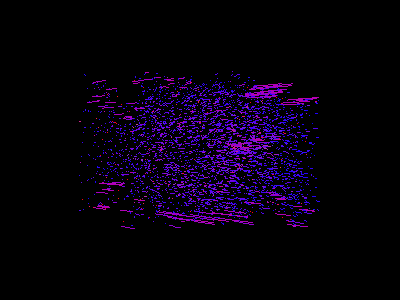

In [17]:
renderer = window.Renderer()

# Add streamlines as a DiPy viz object
stream_actor = actor.line(tensor_streamlines_100)
# Set camera orientation properties
# TODO: allow this as an argument
renderer.set_camera()  # args are: position=(), focal_point=(), view_up=()

# Add streamlines to viz session
renderer.add(stream_actor)

vtk_show(renderer)

In [13]:
from IPython.display import Image

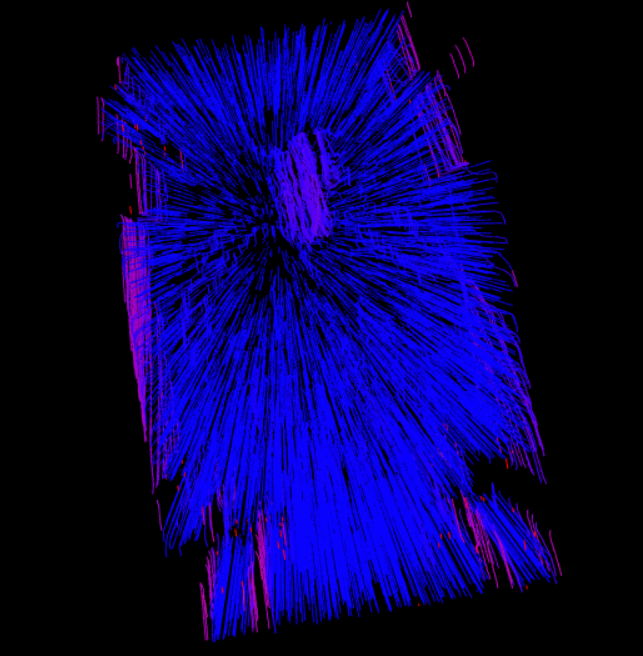

In [14]:
Image("Screenshots/vtk_fullsample_face1.PNG", width=200, height=200)

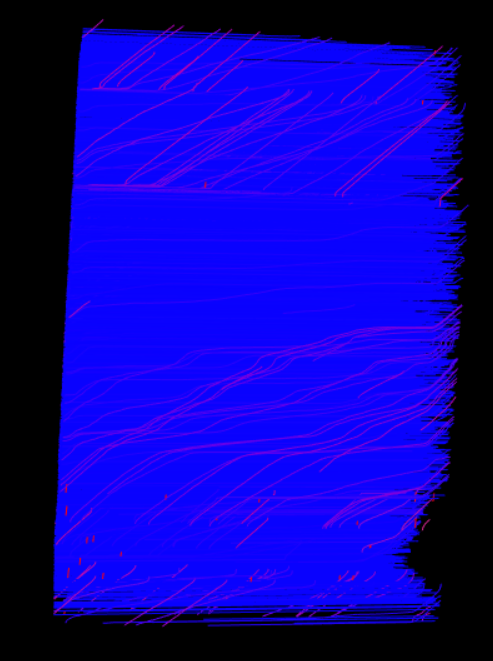

In [16]:
Image("Screenshots/vtk_fullsample_face2.PNG", width=200, height=200)

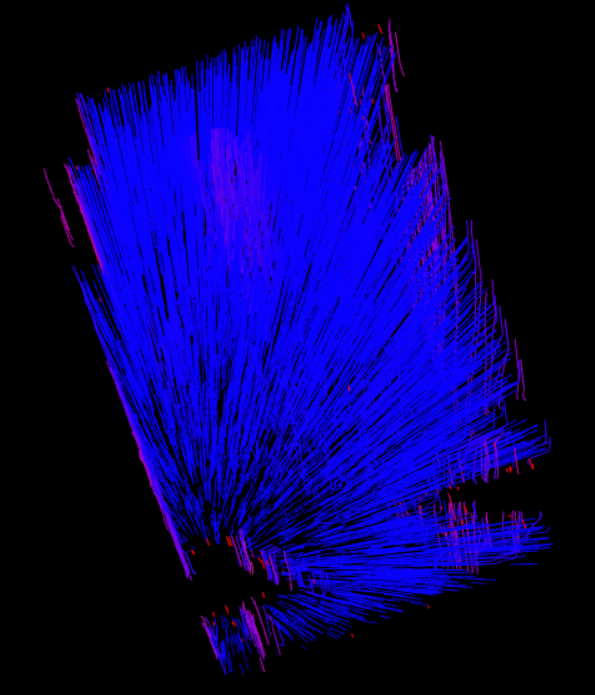

In [17]:
Image("Screenshots/vtk_fullsample_face3.PNG", width=200, height=200)

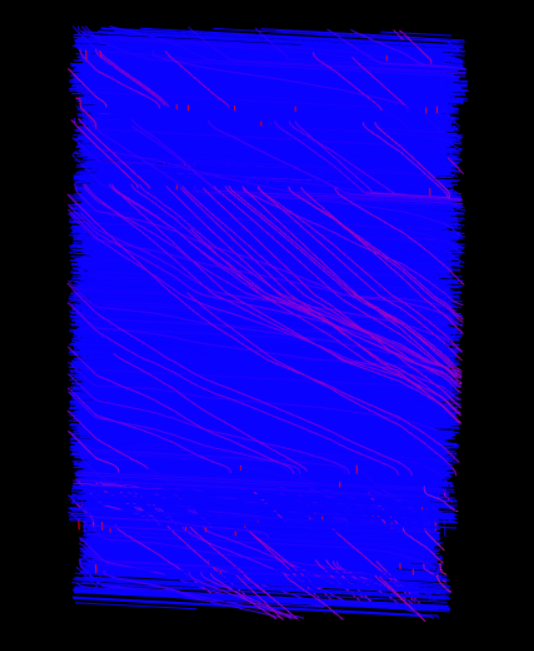

In [18]:
Image("Screenshots/vtk_fullsample_face4.PNG", width=200, height=200)

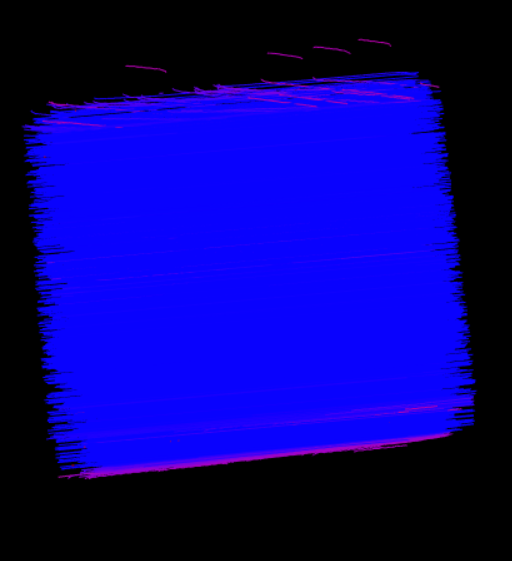

In [19]:
Image("Screenshots/vtk_fullsample_top.PNG", width=200, height=200)

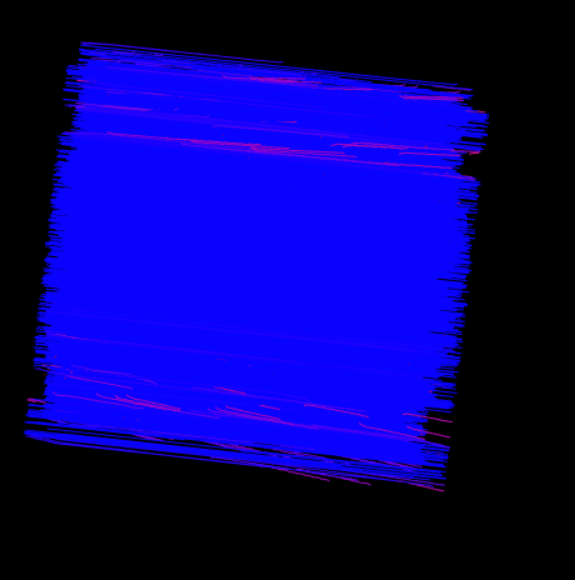

In [20]:
Image("Screenshots/vtk_fullsample_bottom.PNG", width=200, height=200)

In [21]:
len(tensor_streamlines_100)

5000

In [22]:
# tensor_streamlines[0][:,0:2]

5000


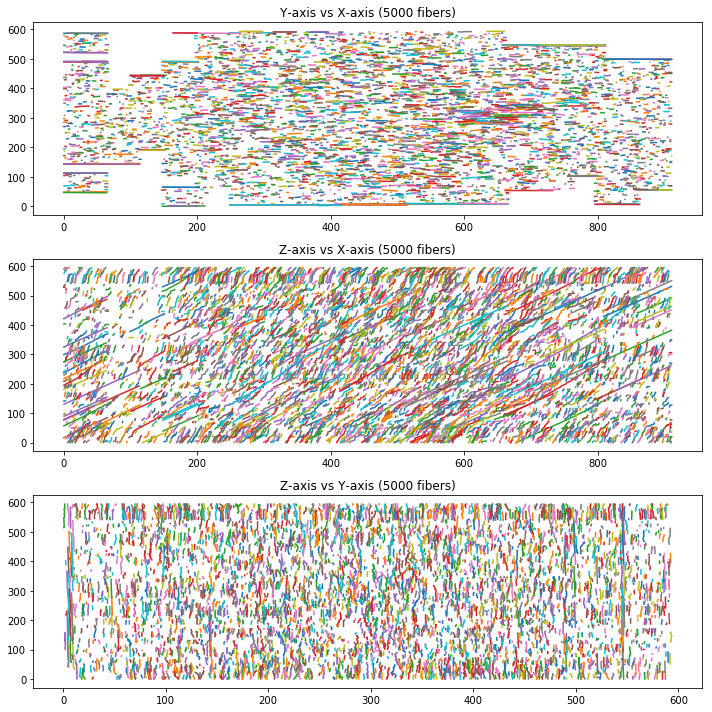

In [18]:
# test = tensor_streamlines[0:1000]
test = tensor_streamlines_100
print len(test)
plt.figure(1)
plt.subplots(figsize=(10, 10))
plt.subplot(311)
plt.title("Y-axis vs X-axis (5000 fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,0], test[i][:,1])
plt.subplot(312)
plt.title("Z-axis vs X-axis (5000 fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,0], test[i][:,2])
plt.subplot(313)
plt.title("Z-axis vs Y-axis (5000 fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,1], test[i][:,2])
plt.tight_layout()
plt.show()

In [61]:
print len(tensor_streamlines)

49988


In [19]:
xfront = (100, 350)
yfront = (200, 400)
zfront = (0, 300)

front = []

for ind, fib in enumerate(tensor_streamlines):
    f = fib[0]
    if (f > [xfront[0], yfront[0], zfront[0]]).all() and (f < [xfront[1], yfront[1], zfront[1]]).all():
        front.append(ind)

print len(front)
fronts = [tensor_streamlines[i] for i in front]

2116


2116


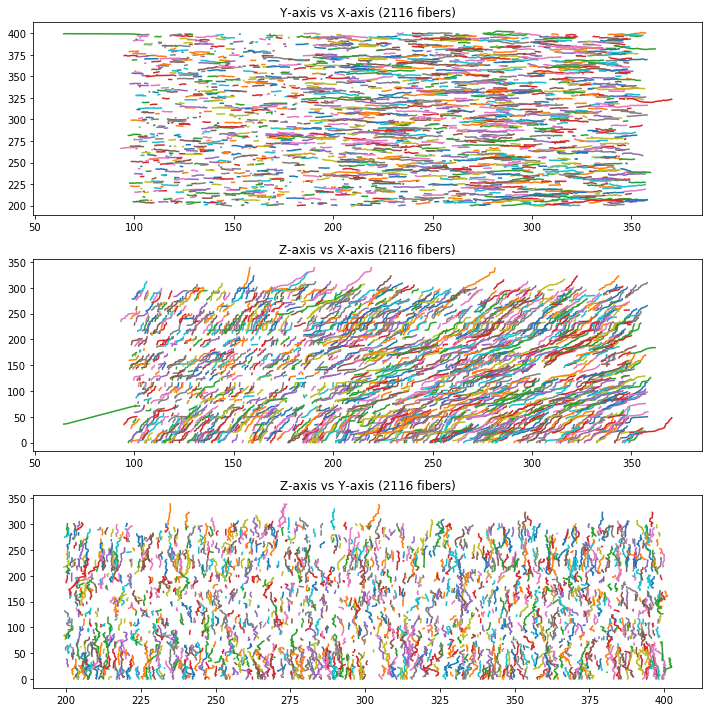

In [20]:
test = fronts
print len(test)
plt.figure(1)
plt.subplots(figsize=(10, 10))
plt.subplot(311)
plt.title("Y-axis vs X-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,0], test[i][:,1])
plt.subplot(312)
plt.title("Z-axis vs X-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,0], test[i][:,2])
plt.subplot(313)
plt.title("Z-axis vs Y-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,1], test[i][:,2])
plt.tight_layout()
plt.show()

In [78]:
xback = (550, 800)
yback = (200, 400)
zback = (0, 300)

back = []

for ind, fib in enumerate(tensor_streamlines):
    f = fib[0]
    if (f > [xback[0], yback[0], zback[0]]).all() and (f < [xback[1], yback[1], zback[1]]).all():
        back.append(ind)

print len(back)
backs = [tensor_streamlines[i] for i in back]

1061


1061


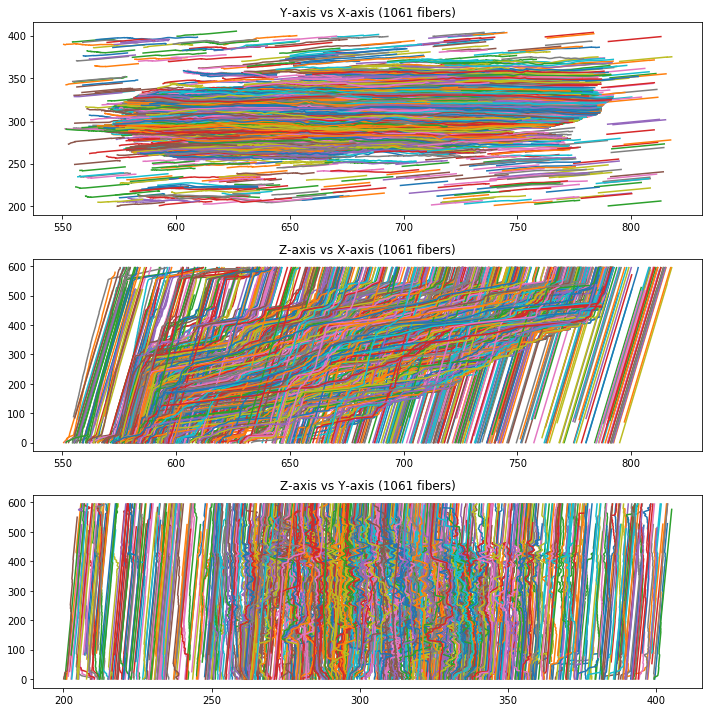

In [79]:
test = backs
print len(test)
plt.figure(1)
plt.subplots(figsize=(10, 10))
plt.subplot(311)
plt.title("Y-axis vs X-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,0], test[i][:,1])
plt.subplot(312)
plt.title("Z-axis vs X-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,0], test[i][:,2])
plt.subplot(313)
plt.title("Z-axis vs Y-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,1], test[i][:,2])
plt.tight_layout()
plt.show()

In [84]:
xftop = (150, 350)
yftop = (250, 350)
zftop = (300, 600)

ftop = []

for ind, fib in enumerate(tensor_streamlines):
    f = fib[0]
    if (f > [xftop[0], yftop[0], zftop[0]]).all() and (f < [xftop[1], yftop[1], zftop[1]]).all():
        ftop.append(ind)

print len(ftop)
ftops = [tensor_streamlines[i] for i in ftop]

1704


1704


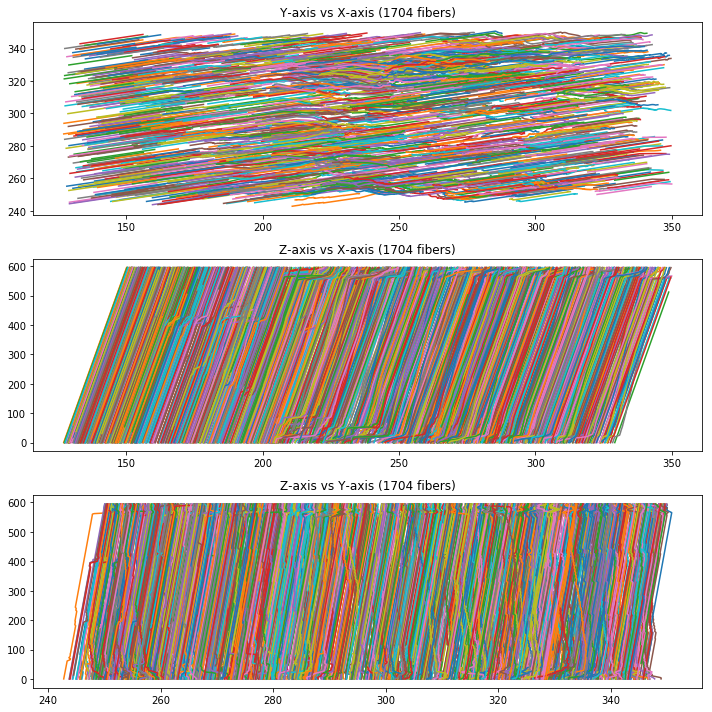

In [85]:
test = ftops
print len(test)
plt.figure(1)
plt.subplots(figsize=(10, 10))
plt.subplot(311)
plt.title("Y-axis vs X-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,0], test[i][:,1])
plt.subplot(312)
plt.title("Z-axis vs X-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,0], test[i][:,2])
plt.subplot(313)
plt.title("Z-axis vs Y-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,1], test[i][:,2])
plt.tight_layout()
plt.show()

In [86]:
xbtop = (550, 750)
ybtop = (250, 350)
zbtop = (300, 600)

btop = []

for ind, fib in enumerate(tensor_streamlines):
    f = fib[0]
    if (f > [xbtop[0], ybtop[0], zbtop[0]]).all() and (f < [xbtop[1], ybtop[1], zbtop[1]]).all():
        btop.append(ind)

print len(btop)
btops = [tensor_streamlines[i] for i in btop]

973


973


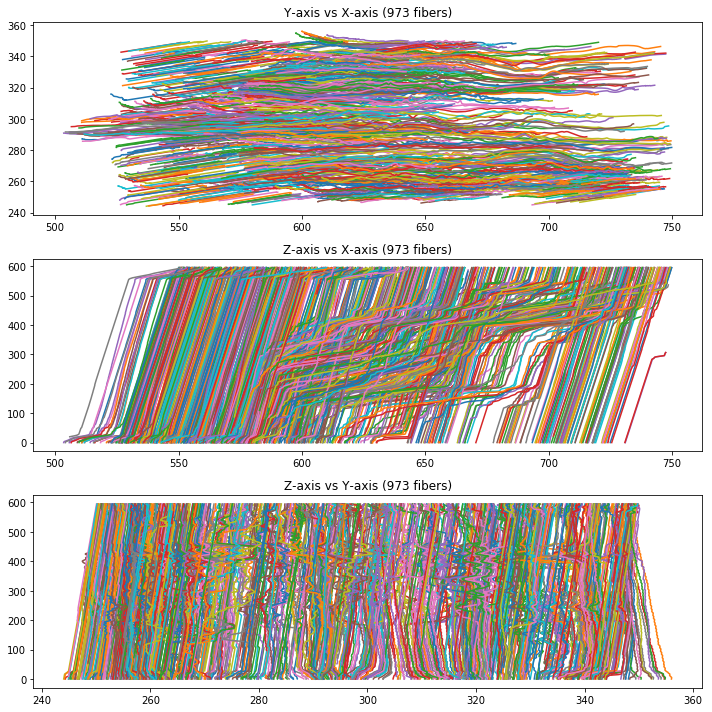

In [87]:
test = btops
print len(test)
plt.figure(1)
plt.subplots(figsize=(10, 10))
plt.subplot(311)
plt.title("Y-axis vs X-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,0], test[i][:,1])
plt.subplot(312)
plt.title("Z-axis vs X-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,0], test[i][:,2])
plt.subplot(313)
plt.title("Z-axis vs Y-axis (" + str(len(test)) + " fibers)")
for i in range(len(test)):
    plt.plot(test[i][:,1], test[i][:,2])
plt.tight_layout()
plt.show()